Run these two commands and restart the notebook. (one time only)
<br>
`jupyter nbextension enable --py --sys-prefix qgrid`
<br>
`jupyter nbextension enable --py --sys-prefix widgetsnbextension`

In [3]:
!pip install stellargraph
!pip install qgrid

In [4]:
import networkx as nx
import networkx.algorithms.community as nxcom

from sklearn.manifold import TSNE
from stellargraph import StellarGraph
from stellargraph.data import BiasedRandomWalk
from gensim.models import Word2Vec

import matplotlib.pyplot as plt
from matplotlib import pylab
import matplotlib.colors as mcolors
from matplotlib.lines import Line2D
%matplotlib inline
from IPython.display import display, clear_output
import numpy as np
import pandas as pd
import pickle
import qgrid
import csv

C:\Users\Kevin\anaconda3\lib\site-packages\gensim\similarities\__init__.py:15: UserWarning: The gensim.similarities.levenshtein submodule is disabled, because the optional Levenshtein package <https://pypi.org/project/python-Levenshtein/> is unavailable. Install Levenhstein (e.g. `pip install python-Levenshtein`) to suppress this warning.
  warnings.warn(msg)


The formula we use is essentially `raw score * (min(weight total, 10) / weight total)`, where 10 can be changed around for different results.

We will use the user score when deciding the weight a target show should get as well. This can also be changed, but the default will be that the target gets multiplied by `(User Score - 5)`.

Can adjust balancing and shifting_avg, as well as genre list for the inputs/sources.

In [5]:
def setup(genres=[],balancing=7, shifting_avg=5):
    cnet = pd.read_csv("combine NET.csv")
    pred = pd.read_csv("Jebby_Lin Simple Ratings.csv")
    alldf = pd.read_csv("combine ALL.csv")
    
    pred_df = pd.merge(pred[["Title", "User Score"]], alldf, how="inner", on="Title").drop("Unnamed: 0", axis=1)
    pred_df["Source"] = pred_df["Title"]
    
    #genre selection
    genre_df = pred_df.copy(deep=True)
    for genre in genres:
        genre_df = genre_df.loc[pred_df[genre] == 1.0]
    
    
    df = pd.merge(cnet, genre_df[["Source", "User Score", "Score"]], on="Source")
    
    df["Weight Total"] = np.clip(df["Weight Total"], a_max = balancing, a_min = None)
    
    df = df[df["Raw"] != -1]
    
    df["Weight"] = df["Weight"] * df["Weight Total"]
    
    df = df.reset_index()
    
    for i in range(0, len(df["User Score"])):
        try:
            df["User Score"][i] = int(df["User Score"][i])
        except:
            df["User Score"][i] = 2
    
    df["User Weight"] = df["Weight"] * (df["User Score"] - shifting_avg)
    
    df["User Score"] = df["User Score"].astype(int)
    
    return df, pred_df

df, pred_df = setup()

<ipython-input-5-ccdede457eed>:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["User Score"][i] = int(df["User Score"][i])
<ipython-input-5-ccdede457eed>:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["User Score"][i] = 2


# TARGET NODES

Every section after this was imported from another notebook, and is not as applicable / optional.
This section takes the combined target weights from all of the user's watched shows.

The following tables will let you sort by any column. They both are useful in determining different things, while being general indicators of how much a show should be recommended to you based on your watch list. If you are unsure of which to use, go with **User Weight**.

**Score Diff / Score Diff z-score** is good for finding shows that you would tend to rate higher than others (it's based on the difference between the score you give to the show and the show's average).

In [6]:
tdf = df.groupby(['Target'], as_index=False)['Weight'].sum()
tdf["Count"] = df.groupby(['Target'], as_index=False)['Weight'].count()["Weight"]
tdf["User Weight"] = df.groupby(['Target'], as_index=False)['User Weight'].sum()["User Weight"]
tdf["User Score"] = df.groupby(['Target'], as_index=False)['User Score'].mean()["User Score"]
tdf["Score"] = df.groupby(['Target'], as_index=False)['Score'].mean()["Score"]
tdf["Score Diff"] = tdf["User Score"] - tdf["Score"]
tdf["Score Diff z-score"] = (tdf["Score Diff"] - tdf["Score Diff"].mean()) / tdf["Score Diff"].std() 
tdf = tdf.drop(["Score"], axis=1)

tdf

,Target,Weight,Count,User Weight,User Score,Score Diff,Score Diff z-score
0,"""Bungaku Shoujo"" Kyou no Oyatsu: Hatsukoi",0.018767,1,0.093834,10.000000,1.869000,1.324879
1,"""Bungaku Shoujo"" Memoire",0.030303,1,0.090909,8.000000,0.299000,-0.015346
2,"""Bungaku Shoujo"" Movie",0.470099,6,2.102273,8.833333,0.797333,0.410055
3,.hack//G.U. Trilogy,0.064815,1,0.259259,9.000000,0.919000,0.513915
4,.hack//Quantum,1.018312,4,3.017659,7.500000,-0.053500,-0.316256
...,...,...,...,...,...,...,...
2238,iDOLM@STER Xenoglossia,0.008872,1,0.044360,10.000000,1.679000,1.162686
2239,number24,0.658644,3,-1.151896,6.333333,-1.224333,-1.315734
2240,s.CRY.ed,0.469048,7,1.168517,8.142857,0.019000,-0.254367
2241,xxxHOLiC,2.001915,7,5.936561,7.428571,-0.795286,-0.949479


### Looking at shows we've watched only (some equivalent to a training set)

In [7]:
#tdf[tdf["Target"].isin(df["Source"])].sort_values("Weight", ascending=False)
qgrid.show_grid(tdf[tdf["Target"].isin(pred_df["Source"])])

QgridWidget(grid_options={'fullWidthRows': True, 'syncColumnCellResize': True, 'forceFitColumns': True, 'defau…

### Looking at other shows (somewhat equivalent to a test set)

In [8]:
#tdf[~tdf["Target"].isin(df["Source"])].sort_values("Weight", ascending=False)[0:10]
qgrid.show_grid(tdf[~tdf["Target"].isin(pred_df["Source"])])

QgridWidget(grid_options={'fullWidthRows': True, 'syncColumnCellResize': True, 'forceFitColumns': True, 'defau…

In [9]:
tdf.to_csv('net2pred.csv')

<br>
<br>
<br>
<br>
<br>
--------------------------------------------------------------------------------------------------------------------------------------------
<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>

# OTHER

Convert to NetworkX graph

In [215]:
D = nx.convert_matrix.from_pandas_edgelist(df,'Source','Target',['Weight'],nx.DiGraph)
G = D

In [216]:
nx.info(D)

'Name: \nType: DiGraph\nNumber of nodes: 2826\nNumber of edges: 16004\nAverage in degree:   5.6631\nAverage out degree:   5.6631'

<a name='rnd'></a>
## 2. Random graph stuff


Copied from website

In [118]:
def draw(G, pos, measures, measure_name):
    
    nodes = nx.draw_networkx_nodes(G, pos, node_size=250, cmap=plt.cm.plasma, 
                                   node_color=list(measures.values()),
                                   nodelist=measures.keys())
    nodes.set_norm(mcolors.SymLogNorm(linthresh=0.01, linscale=1, base=10))
    # labels = nx.draw_networkx_labels(G, pos)
    edges = nx.draw_networkx_edges(G, pos)

    plt.title(measure_name)
    plt.colorbar(nodes)
    plt.axis('off')
    plt.show()

In [119]:
pos = nx.spring_layout(G, seed=675)

Some basic visualizations

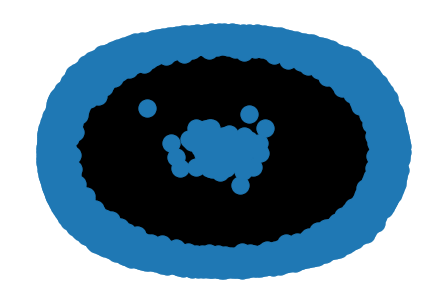

In [120]:
nx.draw(G)

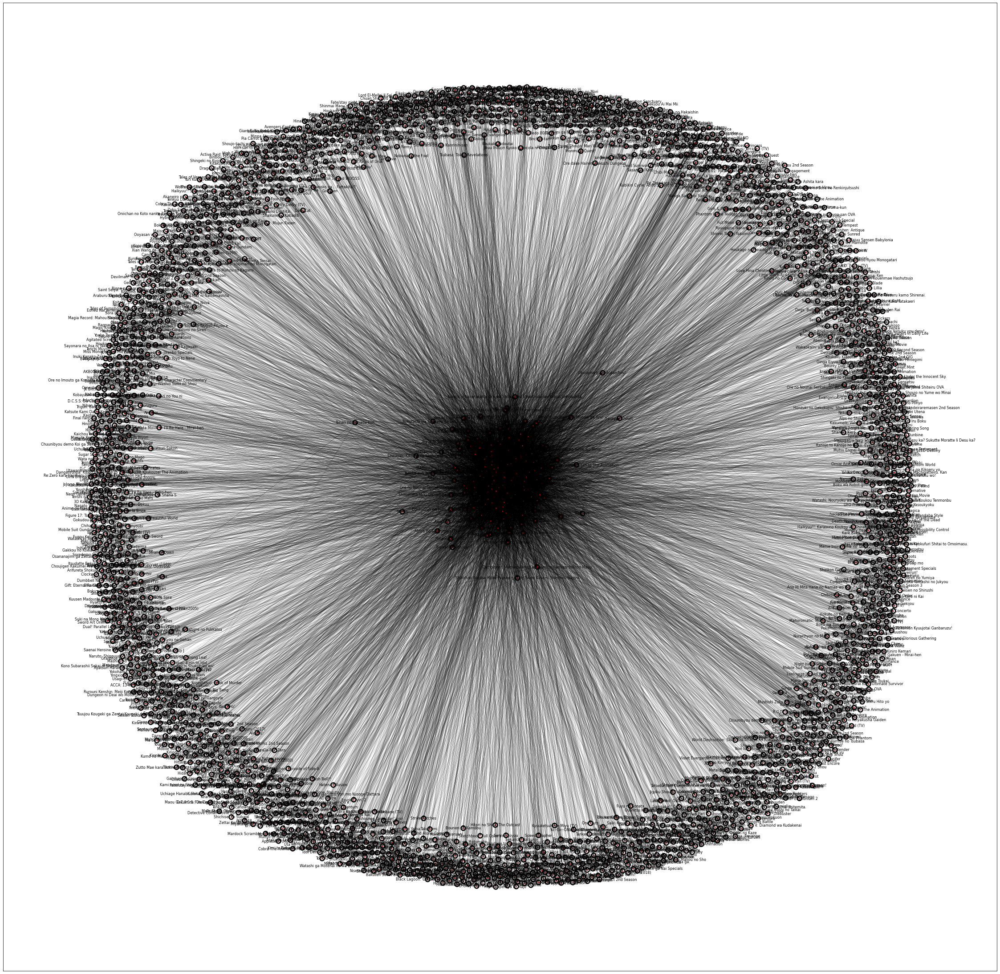

In [121]:
options = {
    "font_size": 8,
    "node_size": 6,
    "node_color": "red",
    "edgecolors": "black",
    "linewidths": 10,
    "width": 0.15,
}

plt.figure(3,figsize=(40,40)) 
nx.draw_networkx(G, **options)
#plt.show()

<a name='bokeh'></a>
# 6. Import Bokeh

In [122]:
import bokeh.io
from bokeh.io import output_file, show
from bokeh.resources import INLINE
from bokeh.models import (BoxSelectTool, Circle, EdgesAndLinkedNodes, HoverTool,
                          MultiLine, NodesAndLinkedEdges, Plot, Range1d, TapTool,
                         BoxZoomTool, ResetTool, OpenURL, CustomJS, Column, SaveTool)
from bokeh.palettes import Spectral4
from bokeh.plotting import figure, output_notebook
from bokeh.models.graphs import from_networkx
from bokeh.models import TextInput, Button

### 5.1 Random examples from documentation

In [123]:
plot = Plot(plot_width=400, plot_height=400,
            x_range=Range1d(-1.1,1.1), y_range=Range1d(-1.1,1.1))
plot.title.text = "Graph Interaction Demonstration"

plot.add_tools(HoverTool(tooltips=None), TapTool(), BoxSelectTool())

graph_renderer = from_networkx(G, nx.circular_layout, scale=1, center=(0,0))

graph_renderer.node_renderer.glyph = Circle(size=15, fill_color=Spectral4[0])
graph_renderer.node_renderer.selection_glyph = Circle(size=15, fill_color=Spectral4[2])
graph_renderer.node_renderer.hover_glyph = Circle(size=15, fill_color=Spectral4[1])

graph_renderer.edge_renderer.glyph = MultiLine(line_color="#CCCCCC", line_alpha=0.8, line_width=5)
graph_renderer.edge_renderer.selection_glyph = MultiLine(line_color=Spectral4[2], line_width=5)
graph_renderer.edge_renderer.hover_glyph = MultiLine(line_color=Spectral4[1], line_width=5)

graph_renderer.selection_policy = NodesAndLinkedEdges()
graph_renderer.inspection_policy = EdgesAndLinkedNodes()

plot.renderers.append(graph_renderer)

output_file("interactive_graphs.html")
show(plot)

# Centrality

In [126]:
degree_centrality = nx.degree_centrality(G)
closeness_centrality = nx.closeness_centrality(G)
betweenness_centrality = nx.betweenness_centrality(G)
hub, authority = nx.hits(G, max_iter=600)
eigenvector_centrality = nx.eigenvector_centrality(G)

Print the first 5 highest scoring nodes for each of the centrality measure. In each of these measures we see more or less the same names popping up, but not in the same order.

In [128]:
centrality = [degree_centrality, closeness_centrality, betweenness_centrality, hub, authority, eigenvector_centrality]
centrality_labels = ["degree centrality", "closeness centrality",
                     "betweenness centrality", "hub", "authority", "eigenvector centrality"]
for idx, m in enumerate(centrality):
    s = sorted(m, key=m.get, reverse=True)[:5]
    print(f"{centrality_labels[idx]}: {s}")

degree centrality: ['Code Geass: Hangyaku no Lelouch', 'Gintama', 'Death Note', 'Angel Beats!', 'Tengen Toppa Gurren Lagann']
closeness centrality: ['Sakura-sou no Pet na Kanojo', 'Toradora!', 'Angel Beats!', 'Chuunibyou demo Koi ga Shitai!', 'Yahari Ore no Seishun Love Comedy wa Machigatteiru.']
betweenness centrality: ['Gintama', 'Sakura-sou no Pet na Kanojo', 'Angel Beats!', 'Toradora!', 'Code Geass: Hangyaku no Lelouch']
hub: ['Angel Beats!', 'Code Geass: Hangyaku no Lelouch', 'Death Note', 'Toradora!', 'Suzumiya Haruhi no Yuuutsu']
authority: ['Angel Beats!', 'Toradora!', 'Sakura-sou no Pet na Kanojo', 'Chuunibyou demo Koi ga Shitai!', 'Suzumiya Haruhi no Yuuutsu']
eigenvector centrality: ['Toradora!', 'Angel Beats!', 'Sakura-sou no Pet na Kanojo', 'Chuunibyou demo Koi ga Shitai!', 'Yahari Ore no Seishun Love Comedy wa Machigatteiru.']


In [129]:
#https://stackoverflow.com/questions/57162519/how-to-convert-dictionary-key-as-row-and-values-as-columns

centrality_dict = [degree_centrality, closeness_centrality, betweenness_centrality, eigenvector_centrality, hub, authority]
cent = pd.DataFrame(centrality_dict).T.reset_index()
cent.columns = ["File","Degree","Closeness","Betweenness", "Eigenvector", "Hub", "Authority"]
cent

,File,Degree,Closeness,Betweenness,Eigenvector,Hub,Authority
0,Fullmetal Alchemist,0.044782,0.034012,0.000840,0.036616,0.007814,0.001801
1,D.Gray-man,0.008512,0.033593,0.000000,0.040989,0.000000,0.002076
2,Busou Renkin,0.002961,0.028885,0.000000,0.013409,0.000000,0.000731
3,Baccano!,0.006662,0.034043,0.000000,0.044590,0.000000,0.001882
4,Soul Eater,0.057365,0.035366,0.001155,0.051116,0.010198,0.002224
...,...,...,...,...,...,...,...
2698,Hiatari Ryoukou!,0.000370,0.023980,0.000000,0.002092,0.000000,0.000045
2699,5-toubun no Hanayome ∬,0.000370,0.021360,0.000000,0.000476,0.000000,0.000009
2700,Hagure Yuusha no Aesthetica: Hajirai Ippai,0.000370,0.022363,0.000000,0.000929,0.000000,0.000033
2701,Towa no Quon 1: Utakata no Kaben,0.000370,0.025043,0.000000,0.002934,0.000000,0.000092


In [130]:
cent.sort_values("Degree", ascending=False).head(5)

,File,Degree,Closeness,Betweenness,Eigenvector,Hub,Authority
7,Code Geass: Hangyaku no Lelouch,0.103997,0.037287,0.002817,0.065515,0.015959,0.002763
217,Gintama,0.094375,0.040486,0.003722,0.102881,0.013532,0.003219
25,Death Note,0.093264,0.037566,0.002318,0.067615,0.015256,0.002854
30,Angel Beats!,0.089563,0.041374,0.003060,0.139038,0.017041,0.004521
98,Tengen Toppa Gurren Lagann,0.085862,0.034244,0.002330,0.034830,0.009965,0.001622


<a name='DiGraph'></a>
# 9. Directed Graph Creation w/ HITS attribute (from undirected)

Converting from an undirected graph to a directed one in BERT's CSV:

Hub/authority are the same because the graph is undirected.
When comparing the two nodes for an edge,
- Lower score hub/authority -> target
- Save hub/authority col as new attribute "HITS"

### 9.2.1 Creating the directed graph

Tables needed from before:

In [131]:
cent

,File,Degree,Closeness,Betweenness,Eigenvector,Hub,Authority
0,Fullmetal Alchemist,0.044782,0.034012,0.000840,0.036616,0.007814,0.001801
1,D.Gray-man,0.008512,0.033593,0.000000,0.040989,0.000000,0.002076
2,Busou Renkin,0.002961,0.028885,0.000000,0.013409,0.000000,0.000731
3,Baccano!,0.006662,0.034043,0.000000,0.044590,0.000000,0.001882
4,Soul Eater,0.057365,0.035366,0.001155,0.051116,0.010198,0.002224
...,...,...,...,...,...,...,...
2698,Hiatari Ryoukou!,0.000370,0.023980,0.000000,0.002092,0.000000,0.000045
2699,5-toubun no Hanayome ∬,0.000370,0.021360,0.000000,0.000476,0.000000,0.000009
2700,Hagure Yuusha no Aesthetica: Hajirai Ippai,0.000370,0.022363,0.000000,0.000929,0.000000,0.000033
2701,Towa no Quon 1: Utakata no Kaben,0.000370,0.025043,0.000000,0.002934,0.000000,0.000092


In [132]:
df

,Unnamed: 0,Unnamed: 0.1,Source,Target,Weight,Raw,Weight Total
2,1591,1591,Fullmetal Alchemist,D.Gray-man,1.571429,33.0,10.0
3,1592,1592,Fullmetal Alchemist,Busou Renkin,0.761905,16.0,10.0
4,1593,1593,Fullmetal Alchemist,Baccano!,0.523810,11.0,10.0
5,1594,1594,Fullmetal Alchemist,Soul Eater,0.428571,9.0,10.0
6,1595,1595,Fullmetal Alchemist,Chrno Crusade,0.380952,8.0,10.0
...,...,...,...,...,...,...,...
14270,999,999,Charlotte,Noragami,0.037313,1.0,10.0
14271,1000,1000,Charlotte,Nagi no Asu kara,0.037313,1.0,10.0
14272,1001,1001,Charlotte,Taboo Tattoo,0.037313,1.0,10.0
14273,1002,1002,Charlotte,The Reflection,0.037313,1.0,10.0


Dictionary with files as keys and hub/authority as values

In [133]:
di_creation_dict = pd.Series(cent["Authority"].values,index=cent["File"]).to_dict()

for k,v in sorted(di_creation_dict.items())[:10]:
  print (k, v)

"Bungaku Shoujo" Kyou no Oyatsu: Hatsukoi 0.00017808441999974615
"Bungaku Shoujo" Movie 0.0003480643544583692
"Eiji" 3.4417774618704574e-05
.hack//Quantum 0.0001718914195293058
.hack//Roots 0.0002603463004851806
.hack//Sign 0.0005221621521616828
.hack//Tasogare no Udewa Densetsu 0.00012472305473389022
.hack//The Movie: Sekai no Mukou ni 0.00012472305473389022
009-1 6.89817129817532e-05
07-Ghost 0.0008476063689722673


Modifying df

In [134]:
di_creation_df = df.copy(deep = True)

ccvert = []
cctarg = []
for i, j in zip(di_creation_df["Source"], di_creation_df["Target"]):
  ccvert.append(di_creation_dict[i])
  cctarg.append(di_creation_dict[j])

di_creation_df["Source_W"] = ccvert
di_creation_df["Target_W"] = cctarg

di_creation_df

,Unnamed: 0,Unnamed: 0.1,Source,Target,Weight,Raw,Weight Total,Source_W,Target_W
2,1591,1591,Fullmetal Alchemist,D.Gray-man,1.571429,33.0,10.0,0.001801,0.002076
3,1592,1592,Fullmetal Alchemist,Busou Renkin,0.761905,16.0,10.0,0.001801,0.000731
4,1593,1593,Fullmetal Alchemist,Baccano!,0.523810,11.0,10.0,0.001801,0.001882
5,1594,1594,Fullmetal Alchemist,Soul Eater,0.428571,9.0,10.0,0.001801,0.002224
6,1595,1595,Fullmetal Alchemist,Chrno Crusade,0.380952,8.0,10.0,0.001801,0.000847
...,...,...,...,...,...,...,...,...,...
14270,999,999,Charlotte,Noragami,0.037313,1.0,10.0,0.002638,0.002636
14271,1000,1000,Charlotte,Nagi no Asu kara,0.037313,1.0,10.0,0.002638,0.001590
14272,1001,1001,Charlotte,Taboo Tattoo,0.037313,1.0,10.0,0.002638,0.000269
14273,1002,1002,Charlotte,The Reflection,0.037313,1.0,10.0,0.002638,0.000092


Now that we have hub/authority values in the same table as edgelist, we can build a directed graph manually.

In [135]:
diG = nx.DiGraph()
diG.add_nodes_from(G)

for k, v in di_creation_dict.items():
  diG.nodes[k]["HITS"] = v

for row in di_creation_df.itertuples():

  if (row.Source_W < row.Target_W):
    diG.add_edge(row.Target, row.Source, weight=row.Weight, HITS=row.Target)
  else:
    diG.add_edge(row.Source, row.Target, weight=row.Weight, HITS=row.Source)


diG.nodes.data()

NodeDataView({'Fullmetal Alchemist': {'HITS': 0.0018011253424831276}, 'D.Gray-man': {'HITS': 0.00207618784117409}, 'Busou Renkin': {'HITS': 0.0007313856432789441}, 'Baccano!': {'HITS': 0.0018819165312294727}, 'Soul Eater': {'HITS': 0.0022235005210805743}, 'Chrno Crusade': {'HITS': 0.0008474851136055215}, 'Ao no Exorcist': {'HITS': 0.0022646337561144643}, 'Code Geass: Hangyaku no Lelouch': {'HITS': 0.0027625491202183778}, 'Neon Genesis Evangelion': {'HITS': 0.0029300820629277503}, 'Fairy Tail': {'HITS': 0.001747039568574317}, 'Naruto': {'HITS': 0.0015001236505066164}, 'Shingeki no Kyojin': {'HITS': 0.0021958060675366735}, 'Blood+': {'HITS': 0.0006124961609311872}, 'Tegamibachi': {'HITS': 0.00048423280237931064}, 'Fullmetal Alchemist: Brotherhood': {'HITS': 0.0022725896842553223}, 'Pumpkin Scissors': {'HITS': 0.000272139406384053}, 'Koukyoushihen Eureka Seven': {'HITS': 0.0010361442508599846}, '07-Ghost': {'HITS': 0.0008476063689722673}, 'Kuroshitsuji': {'HITS': 0.002122921267580238}, 'O

Bokeh example

In [136]:
SAME_CLUB_COLOR, DIFFERENT_CLUB_COLOR = "black", "red"
edge_attrs = {}

for start_node, end_node, _ in diG.edges(data=True):
    edge_color = SAME_CLUB_COLOR if diG.nodes[start_node]["HITS"] == diG.nodes[end_node]["HITS"] else DIFFERENT_CLUB_COLOR
    edge_attrs[(start_node, end_node)] = edge_color

nx.set_edge_attributes(diG, edge_attrs, "edge_color")

# Show with Bokeh
plot = Plot(plot_width=400, plot_height=400,
            x_range=Range1d(-1.1, 1.1), y_range=Range1d(-1.1, 1.1))
plot.title.text = "Graph Interaction Demonstration"

node_hover_tool = HoverTool(tooltips=[("index", "@index"), ("HITS", "@HITS")])
plot.add_tools(node_hover_tool, BoxZoomTool(), ResetTool())

graph_renderer = from_networkx(diG, nx.spring_layout, scale=1, center=(0, 0))

graph_renderer.node_renderer.glyph = Circle(size=15, fill_color=Spectral4[0])
graph_renderer.edge_renderer.glyph = MultiLine(line_color="edge_color", line_alpha=0.8, line_width=1)
plot.renderers.append(graph_renderer)

output_file("interactive_graphs.html")
show(plot)

<a name='kmc'></a>
# 11. K-Means Clustering

K-means is considered by many to be the gold standard when it comes to clustering due to its simplicity and performance, so it's the first one we'll try out.

When you have no idea at all what algorithm to use, K-means is usually the first choice.

K-means works by defining spherical clusters that are separable in a way so that the mean value converges towards the cluster center. Because of this, K-Means may underperform sometimes.

### 11.1 Clustering, Connectivity and other Graph properties using Networkx

https://www.geeksforgeeks.org/python-clustering-connectivity-and-other-graph-properties-using-networkx/

Returns a Dictionary with clustering value of each node

In [144]:
print(nx.clustering(G))

{'Fullmetal Alchemist': 0.08065184366800165, 'D.Gray-man': 0.383399209486166, 'Busou Renkin': 0.39285714285714285, 'Baccano!': 0.39869281045751637, 'Soul Eater': 0.07809875713805844, 'Chrno Crusade': 0.3888888888888889, 'Ao no Exorcist': 0.3412698412698413, 'Code Geass: Hangyaku no Lelouch': 0.037220780542410827, 'Neon Genesis Evangelion': 0.25846702317290554, 'Fairy Tail': 0.08773968622893666, 'Naruto': 0.06348327055173943, 'Shingeki no Kyojin': 0.057983418026210216, 'Blood+': 0.19047619047619047, 'Tegamibachi': 0.5333333333333333, 'Fullmetal Alchemist: Brotherhood': 0.06419874554175378, 'Pumpkin Scissors': 1.0, 'Koukyoushihen Eureka Seven': 0.32051282051282054, '07-Ghost': 0.5, 'Kuroshitsuji': 0.3079710144927536, 'One Piece': 0.35327635327635326, 'Dr. Stone': 0.3897058823529412, 'InuYasha': 0.2761904761904762, 'Scrapped Princess': 1.0, 'Darker than Black: Kuro no Keiyakusha': 0.3722943722943723, 'Kiba': 0.39285714285714285, 'Death Note': 0.048145100025322865, 'Dragon Ball Z': 0.67948

Get the Clustering value for the whole Graph (0 - 1)

In [145]:
nx.average_clustering(G)

0.26437324570612514

Transitivity of a Graph = 3 * Number of triangles in a Graph / Number of connected triads in the Graph.

In other words, it is the fraction of all possible triangles present in G

also (0-1)

In [146]:
nx.transitivity(G)

0.04437560712358338

Now, we know that the graph is connected. Networkx provides a number of in built functions to check on the various Connectivity features of a Graph.
If it were not connected, there would be many useful functions..

Few important characteristics of a Graph

- Eccentricity: For a node n in a graph G, the eccentricity of n is the largest possible shortest path distance between n and all other nodes.
- Diameter : The maximum shortest distance between a pair of nodes in a graph G is its Diamater. It is the largest possible eccentricity value of a node.
- Radius : It is the minimum eccentricity value of a node.
- Periphery : It is the set of nodes that have their eccentricity equal to their Diameter.
- Center : Center of a Graph is the set of nodes whose eccentricity is equal to the radius of the Graph.

### 11.2 Clustering Setup

https://www.learndatasci.com/tutorials/k-means-clustering-algorithms-python-intro/

In [150]:
from sklearn import cluster
import networkx as nx
from collections import defaultdict
import matplotlib.pyplot as plt
from matplotlib import cm
import seaborn as sns
import pandas as pd
import numpy as np
from sklearn.metrics.cluster import normalized_mutual_info_score
from sklearn.metrics.cluster import adjusted_rand_score

For small / moderate graphs, one simple option is to store the node names as a list:

In [151]:
nodes_list = np.array(list(G.nodes()))
nodes_list

array(['Fullmetal Alchemist', 'D.Gray-man', 'Busou Renkin', ...,
       'Hagure Yuusha no Aesthetica: Hajirai Ippai',
       'Towa no Quon 1: Utakata no Kaben', 'The Reflection'], dtype='<U99')

Added node_id and neighbor_id to find index of a text because the indices must be in integers, not strings.

Inspired: https://stackoverflow.com/questions/25160191/mapping-from-a-nodes-name-to-its-index-and-vice-versa-in-networkx , might not work well with huge graphs though.

In [152]:
def graph_to_edge_matrix(G):
    """Convert a networkx graph into an edge matrix.
    See https://www.wikiwand.com/en/Incidence_matrix for a good explanation on edge matrices
   
    Parameters
    ----------
    G : networkx graph
    """
    # Initialize edge matrix with zeros
    edge_mat = np.zeros((len(G), len(G)), dtype=int)

    # Loop to set 0 or 1 (diagonal elements are set to 1)
    for node in G:
      node_id = np.where(nodes_list == node)[0][0]
      for neighbor in G.neighbors(node):
        # To recover the index from the name:
        neighbor_id = np.where(nodes_list == neighbor)[0][0]
        edge_mat[node_id][neighbor_id] = 1
      edge_mat[node_id][node_id] = 1

    return edge_mat

In [153]:
Q = nx.karate_club_graph()
posQ = nx.spring_layout(Q)
edge_mat = graph_to_edge_matrix(G)
edge_mat

array([[1, 1, 1, ..., 0, 0, 0],
       [0, 1, 0, ..., 0, 0, 0],
       [0, 0, 1, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 1, 0, 0],
       [0, 0, 0, ..., 0, 1, 0],
       [0, 0, 0, ..., 0, 0, 1]])

### 11.3 Fitting K-Means & Other Clustering Models

In [154]:
k_clusters = 4
results = []
algorithms = {}

algorithms['kmeans'] = cluster.KMeans(n_clusters=k_clusters, n_init=200)

In [155]:
algorithms['kmeans'].fit(edge_mat)

KMeans(n_clusters=4, n_init=200)

Agglomerative Clustering

The main idea behind Agglomerative clustering is that each node first starts in its own cluster, and then pairs of clusters recursively merge together in a way that minimally increases a given linkage distance.

In [156]:
algorithms['agglom'] = cluster.AgglomerativeClustering(n_clusters=k_clusters, linkage="ward")

Spectral Clustering

In [157]:
algorithms['spectral'] = cluster.SpectralClustering(n_clusters=k_clusters, affinity="precomputed", n_init=200)

Affinity Propagation

Affinity propagation performs really well on several computer vision and biology problems, such as clustering pictures of human faces and identifying regulated transcripts

In [158]:
algorithms['affinity'] = cluster.AffinityPropagation(damping=0.6)

Fitting each model:

In [159]:
for model in algorithms.values():
    model.fit(edge_mat)
    results.append(list(model.labels_))

C:\Users\Kevin\anaconda3\lib\site-packages\sklearn\utils\validation.py:72: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  return f(**kwargs)
C:\Users\Kevin\anaconda3\lib\site-packages\sklearn\cluster\_affinity_propagation.py:146: FutureWarning: 'random_state' has been introduced in 0.23. It will be set to None starting from 0.25 which means that results will differ at every function call. Set 'random_state' to None to silence this warning, or to 0 to keep the behavior of versions <0.23.
  warnings.warn(("'random_state' has been introduced in 0.23. "
C:\Users\Kevin\anaconda3\lib\site-packages\sklearn\cluster\_affinity_propagation.py:243: ConvergenceWarning: Affinity propagation did not converge, this model will not have any cluster centers.
  warnings.warn("Affinity propagation did not converge, this model "


### 11.4 Metrics & Plotting

- Normalized Mutual Information (NMI) - Mutual Information of two random variables is a measure of the mutual dependence between the two variables. Normalized Mutual Information is a normalization of the Mutual Information (MI) score to scale the results between 0 (no mutual information) and 1 (perfect correlation). In other words, 0 means dissimilar and 1 means
a perfect match.

- Adjusted Rand Score (ARS) - Adjusted Rand Score on the other hand, computes a similarity measure between two clusters. ARS considers all pairs of samples and counts pairs that are assigned in the same or different clusters in the predicted and true clusters. If that's a little weird to think about, have in mind that, for now, 0 is the lowest similarity and 1 is the highest.

- Average score - average of NMI and ARS

Requires y_true

### 11.5 Visualization

In [160]:
#!pip3 install -U matplotlib

In [161]:
def draw_communities(G, membership, pos):
    """Draws the nodes to a plot with assigned colors for each individual cluster
    Parameters
    ----------
    G : networkx graph
    membership : list
        A list where the position is the student and the value at the position is the student club membership.
        E.g. `print(membership[8]) --> 1` means that student #8 is a member of club 1.
    pos : positioning as a networkx spring layout
        E.g. nx.spring_layout(G)
    """ 
    fig, ax = plt.subplots(figsize=(16,9))
    
    # Convert membership list to a dict where key=club, value=list of students in club
    club_dict = defaultdict(list)
    for student, club in enumerate(membership):
        club_dict[club].append(student)
    
    # Normalize number of clubs for choosing a color
    #norm = plt.colors.Normalize(vmin=0, vmax=len(club_dict.keys()))
    
    for club, members in club_dict.items():
        nx.draw_networkx_nodes(G, pos,
                               nodelist=members,
                               #node_color=cm.jet(norm(club)),
                               node_size=500,
                               alpha=0.8,
                               ax=ax)

    # Draw edges (social connections) and show final plot
    plt.title("Undirected BERT")
    nx.draw_networkx_edges(G, pos, alpha=0.5, ax=ax)

In [162]:
pos = nx.spring_layout(G)

NetworkXError: Node 0 has no position.

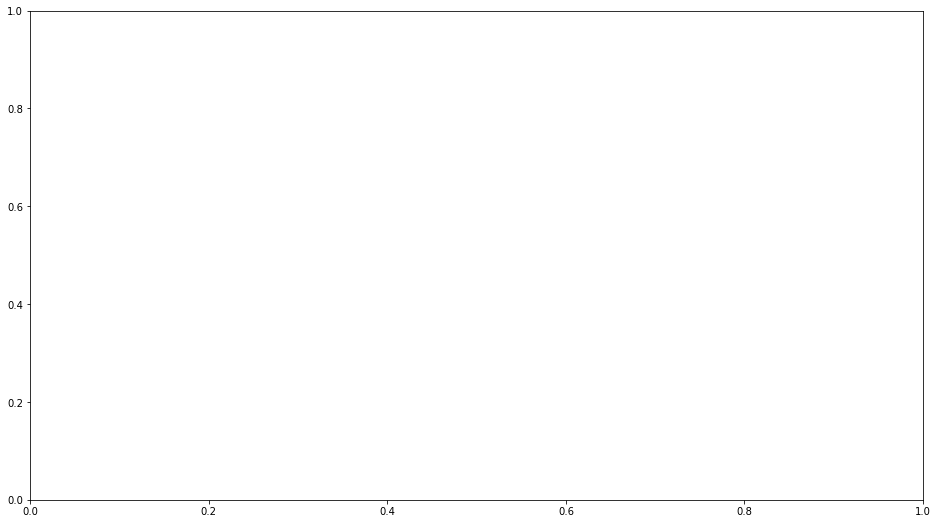

In [163]:
draw_communities(G, algorithms['kmeans'].labels_, pos)

Output for K-means clustering

In [170]:
algorithms['kmeans'].labels_

array([1, 0, 0, ..., 0, 0, 0])

<a name='nkc'></a>
# 12. Node2Vec with K-Means Clustering

Combining the work of sections 7, 8, and 11.

Need to turn clustering labels into dictionary with nodes as keys.

In [171]:
G_nodelist = list(G.nodes)
clust_list = list(algorithms['kmeans'].labels_)

n2v_dict = {G_nodelist[i]: clust_list[i] for i in range(len(G_nodelist))}
#n2v_dict

In [172]:
import copy
G_n2v = copy.deepcopy(G)
nx.set_node_attributes(G_n2v, n2v_dict, "kmeans")

In [173]:
SAME_CLUB_COLOR, DIFFERENT_CLUB_COLOR = "black", "red"
edge_attrs = {}

for start_node, end_node, _ in G_n2v.edges(data=True):
    edge_color = SAME_CLUB_COLOR if G_n2v.nodes[start_node]["kmeans"] == G_n2v.nodes[end_node]["kmeans"] else DIFFERENT_CLUB_COLOR
    edge_attrs[(start_node, end_node)] = edge_color

nx.set_edge_attributes(G_n2v, edge_attrs, "edge_color")

# Show with Bokeh
plot = Plot(plot_width=400, plot_height=400,
            x_range=Range1d(-1.1, 1.1), y_range=Range1d(-1.1, 1.1))
plot.title.text = "Graph Interaction Demonstration"

node_hover_tool = HoverTool(tooltips=[("index", "@index"), ("kmeans", "@kmeans")])
plot.add_tools(node_hover_tool, BoxZoomTool(), ResetTool())

graph_renderer = from_networkx(G_n2v, nx.spring_layout, scale=1, center=(0, 0))

graph_renderer.node_renderer.glyph = Circle(size=15, fill_color=Spectral4[0])
graph_renderer.edge_renderer.glyph = MultiLine(line_color="edge_color", line_alpha=0.8, line_width=1)
plot.renderers.append(graph_renderer)

output_file("interactive_graphs.html")
show(plot)

Copied from part 8

In [174]:
SGn = StellarGraph.from_networkx(G_n2v, node_type_default="paper", edge_type_default="cites")
print(SGn.info())

StellarDiGraph: Directed multigraph
 Nodes: 2703, Edges: 14134

 Node types:
  paper: [2703]
    Features: none
    Edge types: paper-cites->paper

 Edge types:
    paper-cites->paper: [14134]
        Weights: all 1 (default)
        Features: none


In [175]:
rw = BiasedRandomWalk(SGn)

walks = rw.run(
    nodes=list(G_n2v.nodes()),  # root nodes
    length=100,  # maximum length of a random walk
    n=10,  # number of random walks per root node
    p=0.5,  # Defines (unormalised) probability, 1/p, of returning to source node
    q=2.0,  # Defines (unormalised) probability, 1/q, for moving away from source node
)
print("Number of random walks: {}".format(len(walks)))

Number of random walks: 27030


In [176]:
str_walks = [[str(n) for n in walk] for walk in walks]
model = Word2Vec(str_walks, size=128, window=5, min_count=0, sg=1, workers=2, iter=1)
model.wv["Garelli_Michel_1994_AMMY93_tablets_Ankara.txt"].shape

TypeError: __init__() got an unexpected keyword argument 'size'

Value of embedding is for instance

In [ ]:
model.wv["Garelli_Michel_1994_AMMY93_tablets_Ankara.txt"]

In [ ]:
# Retrieve node embeddings and corresponding subjects
node_ids = model.wv.index2word  # list of node IDs
node_embeddings = (
    model.wv.vectors
)  # numpy.ndarray of size number of nodes times embeddings dimensionality
node_targets = [ G_n2v.nodes[node_id]['kmeans'] for node_id in node_ids]

In [ ]:
# Apply t-SNE transformation on node embeddings
tsne = TSNE(n_components=2)
node_embeddings_2d = tsne.fit_transform(node_embeddings)

In [ ]:
# draw the points
alpha = 0.7
label_map = {l: i for i, l in enumerate(np.unique(node_targets))}
node_colours = [label_map[target] for target in node_targets]

plt.figure(figsize=(10, 8))
plt.scatter(
    node_embeddings_2d[:, 0],
    node_embeddings_2d[:, 1],
    c=node_colours,
    cmap="jet",
    alpha=alpha,
)

<a name='gexf'></a>
### NetworkX to GEXF (Gephi)


In [ ]:
#nx.write_gexf( G , f"{save_folder}/BERT2Net.gexf" )

In [ ]:
#nx.read_gexf(f"{save_folder}/BERT2Net.gexf")

<br>



---



In [ ]:
#!jupyter nbconvert --to html "INSERTNAME.ipynb"